**Image data set - Pokemon Images**

**Exploratory Data Analysis (EDA)**

**Basic Information, Visual Inspection, Basic Pixel Intensity Analysis**

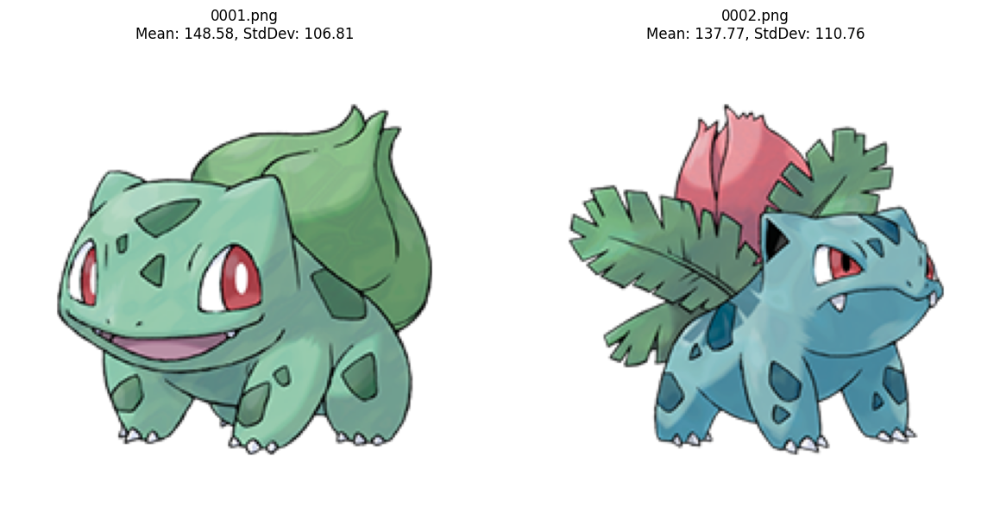

(['0001.png',
  '0002.png',
  '0003.png',
  '0004.png',
  '0005.png',
  '0006.png',
  '0007.png',
  '0008.png',
  '0009.png',
  '0010.png'],
 [(215, 215, 4),
  (215, 215, 4),
  (215, 215, 4),
  (215, 215, 4),
  (215, 215, 4),
  (215, 215, 4),
  (215, 215, 4),
  (215, 215, 4),
  (215, 215, 4),
  (215, 215, 4)],
 [148.58417522985397,
  137.76725797728503,
  143.18191995673337,
  136.5743212547323,
  131.8638345051379,
  137.14296917252568,
  131.963520822066,
  140.50226068144943,
  142.27650081124932,
  128.59250946457544],
 [106.81012790420947,
  110.7639027548563,
  113.22468135586149,
  115.04922044181305,
  115.11154424750171,
  116.16817497147377,
  114.6982109454799,
  115.8108558485302,
  110.31889982551924,
  114.20770586567308])

In [6]:
# Importing necessary libraries
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os

# List of image files
image_dir='Images'
image_files = [f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))]
image_files.sort()

# Extracting properties using PIL
image_shapes_pil = []
pixel_means_pil = []
pixel_stddevs_pil = []

for img_file in image_files:
    with Image.open(os.path.join(image_dir, img_file)) as img:
        img_array = np.array(img)
        image_shapes_pil.append(img_array.shape)
        pixel_means_pil.append(np.mean(img_array))
        pixel_stddevs_pil.append(np.std(img_array))

# Display a couple of images for visual inspection
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Display first image with stats
img1_pil = Image.open(os.path.join(image_dir, image_files[0]))
ax[0].imshow(img1_pil)
ax[0].set_title(f"{image_files[0]}\nMean: {pixel_means_pil[0]:.2f}, StdDev: {pixel_stddevs_pil[0]:.2f}")
ax[0].axis('off')

# Display second image with stats
img2_pil = Image.open(os.path.join(image_dir, image_files[1]))
ax[1].imshow(img2_pil)
ax[1].set_title(f"{image_files[1]}\nMean: {pixel_means_pil[1]:.2f}, StdDev: {pixel_stddevs_pil[1]:.2f}")
ax[1].axis('off')

plt.tight_layout()
plt.show()

image_files[:10], image_shapes_pil, pixel_means_pil, pixel_stddevs_pil

**Histogram of Pixel Values**

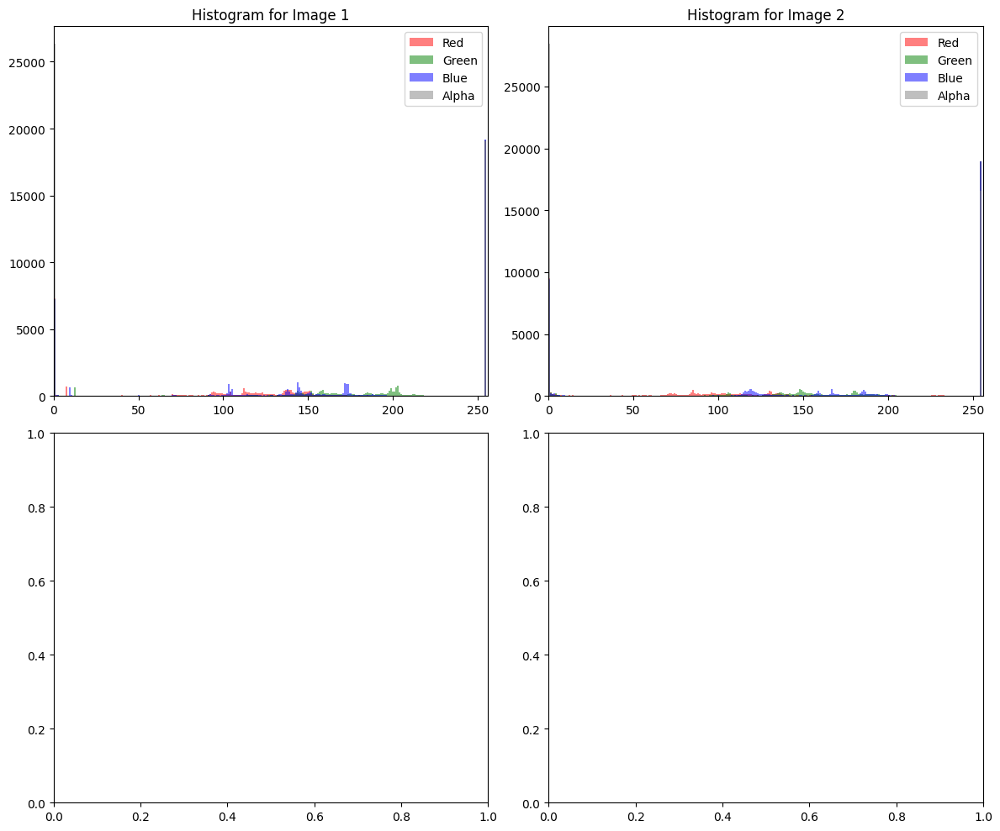

In [7]:
# Adjusting the color list to use full names instead of abbreviations
def plot_histogram_updated(img_array, ax, title):
    colors = ['red', 'green', 'blue', 'gray']
    labels = ['Red', 'Green', 'Blue', 'Alpha']

    for channel, color, label in zip(range(4), colors, labels):
        ax.hist(img_array[:,:,channel].ravel(), bins=256, color=color, alpha=0.5, label=label)
        ax.set_xlim([0, 256])
        ax.set_title(title)
        ax.legend(loc='upper right')

fig, axarr = plt.subplots(2, 2, figsize=(12, 10))

# Plot histogram for the first image
plot_histogram_updated(np.array(img1_pil), axarr[0, 0], "Histogram for Image 1")

# Plot histogram for the second image
plot_histogram_updated(np.array(img2_pil), axarr[0, 1], "Histogram for Image 2")

plt.tight_layout()
plt.show()

**Basic Color Analysis**

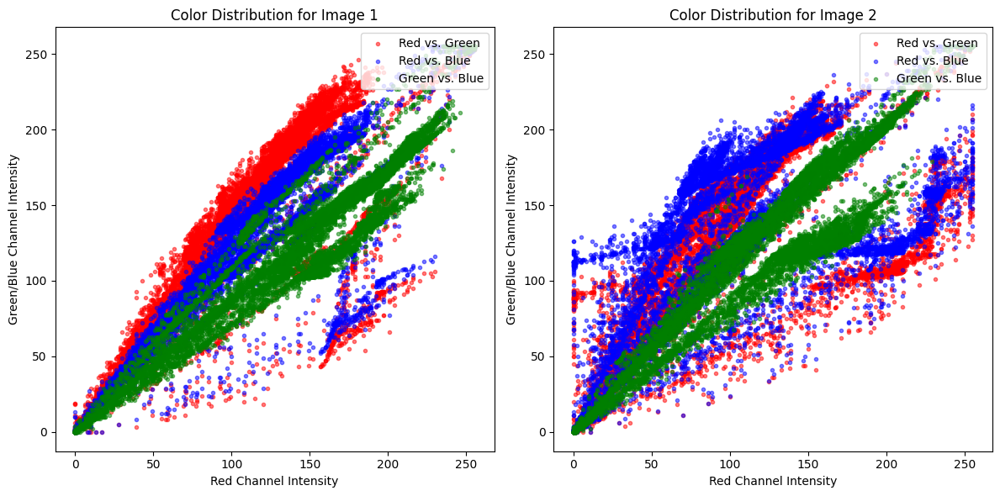

In [8]:
# Function to plot color distribution in RGB space for an image
def plot_color_distribution(img_array, ax, title):
    # Extract RGB values
    r = img_array[:,:,0].ravel()
    g = img_array[:,:,1].ravel()
    b = img_array[:,:,2].ravel()

    # Scatter plot
    ax.scatter(r, g, color="red", marker=".", alpha=0.5, label="Red vs. Green")
    ax.scatter(r, b, color="blue", marker=".", alpha=0.5, label="Red vs. Blue")
    ax.scatter(g, b, color="green", marker=".", alpha=0.5, label="Green vs. Blue")

    ax.set_xlabel("Red Channel Intensity")
    ax.set_ylabel("Green/Blue Channel Intensity")
    ax.set_title(title)
    ax.legend(loc='upper right')

fig, axarr = plt.subplots(1, 2, figsize=(12, 6))

# Plot color distribution for the first image
plot_color_distribution(np.array(img1_pil), axarr[0], "Color Distribution for Image 1")

# Plot color distribution for the second image
plot_color_distribution(np.array(img2_pil), axarr[1], "Color Distribution for Image 2")

plt.tight_layout()
plt.show()

**Clustering using K-means**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


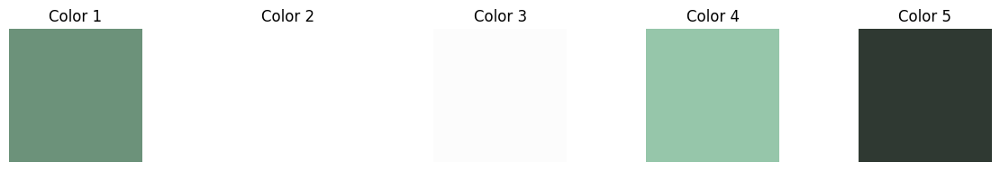

In [9]:
from sklearn.cluster import KMeans

# Sample image for clustering
sample_img = np.array(img1_pil)

# Reshape the image to be a list of pixels
pixels = sample_img.reshape(-1, 4)  # Including the alpha channel

# Apply K-means clustering
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters)
kmeans.fit(pixels)

# Get the RGB values of the cluster centers
cluster_centers = kmeans.cluster_centers_

# Visualize the dominant colors
fig, ax = plt.subplots(1, n_clusters, figsize=(12, 2))

for i, center in enumerate(cluster_centers):
    # Create an image with the color of the centroid
    color_img = np.zeros((50, 50, 4), dtype=np.uint8)
    color_img[:,:,:] = center
    ax[i].imshow(color_img)
    ax[i].axis('off')
    ax[i].set_title(f"Color {i+1}")

plt.tight_layout()
plt.show()

Dominant Colors in 0001.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


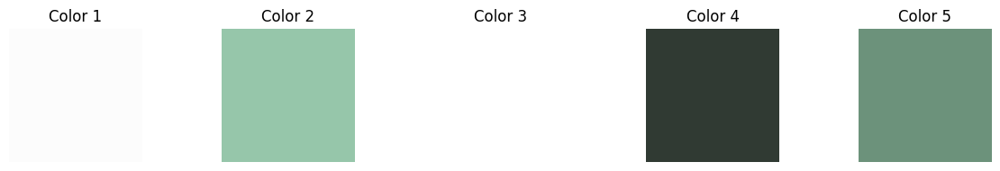

Dominant Colors in 0002.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


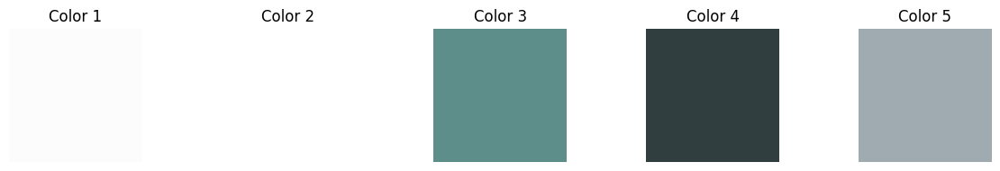

Dominant Colors in 0003.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


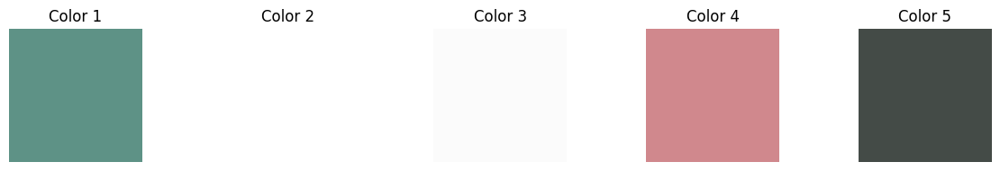

Dominant Colors in 0004.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


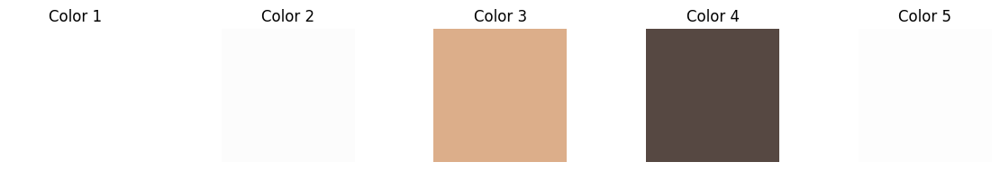

Dominant Colors in 0005.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


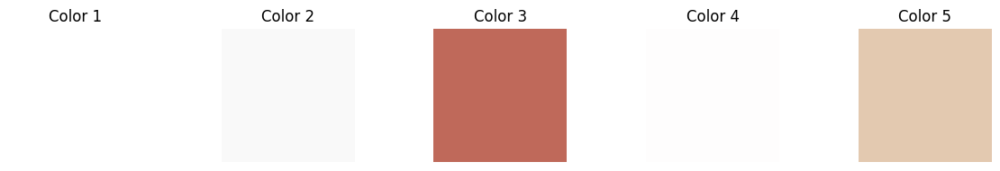

Dominant Colors in 0006.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


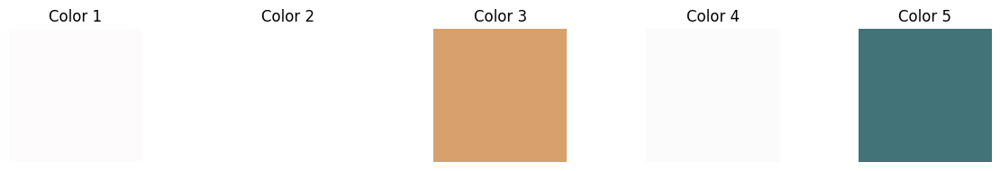

Dominant Colors in 0007.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


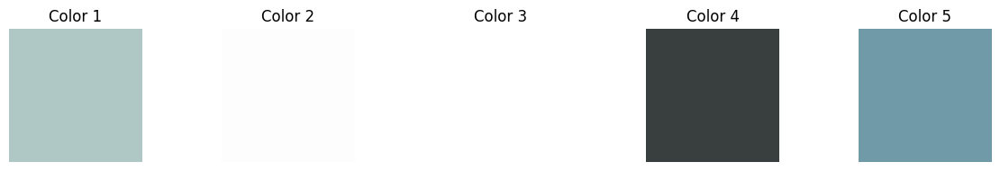

Dominant Colors in 0008.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


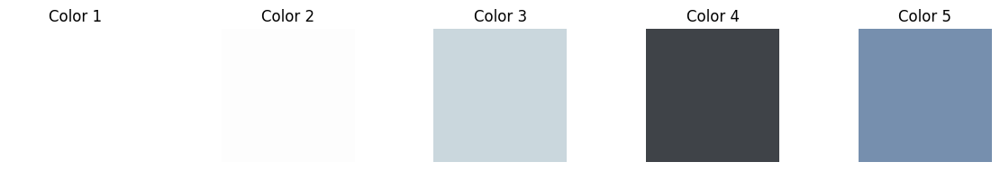

Dominant Colors in 0009.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


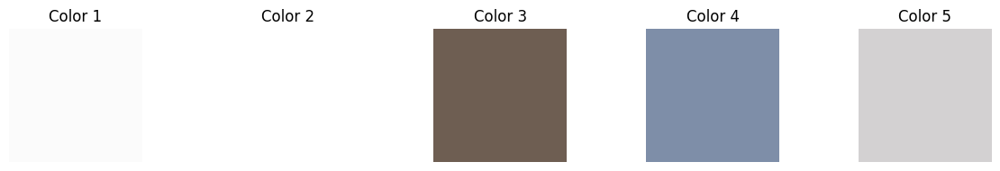

Dominant Colors in 0010.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


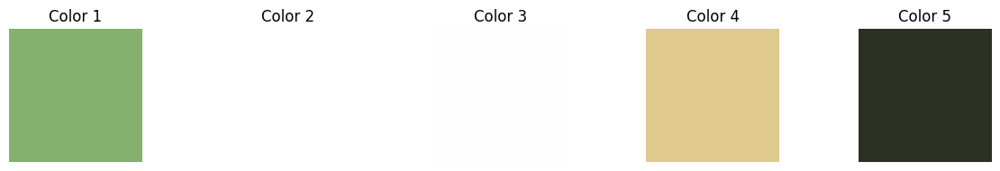

In [10]:
# Function to apply K-means clustering and visualize dominant colors
def visualize_dominant_colors(img, n_clusters=5):
    # Reshape the image to be a list of pixels
    pixels = img.reshape(-1, 4)  # Including the alpha channel

    # Apply K-means clustering
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(pixels)

    # Get the RGB values of the cluster centers
    cluster_centers = kmeans.cluster_centers_

    # Create a figure to visualize the dominant colors
    fig, ax = plt.subplots(1, n_clusters, figsize=(12, 2))

    for i, center in enumerate(cluster_centers):
        # Create an image with the color of the centroid
        color_img = np.zeros((50, 50, 4), dtype=np.uint8)
        color_img[:,:,:] = center
        ax[i].imshow(color_img)
        ax[i].axis('off')
        ax[i].set_title(f"Color {i+1}")

    plt.tight_layout()
    plt.show()

# Apply clustering technique and visualize results for each image
for img_file in image_files:
    img_path = os.path.join(image_dir, img_file)
    with Image.open(img_path) as img:
        img_array = np.array(img)
        print(f"Dominant Colors in {img_file}:")
        visualize_dominant_colors(img_array)

**K-means clustering on Sampling pixels**

Dominant Colors in 0001.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


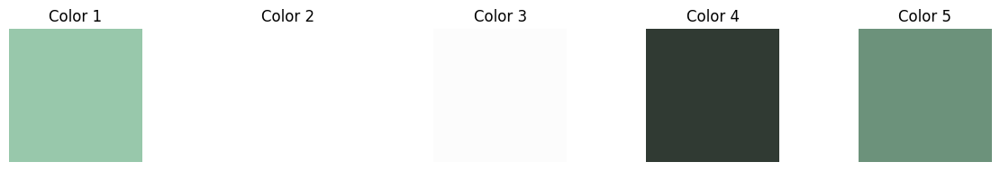

Dominant Colors in 0002.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


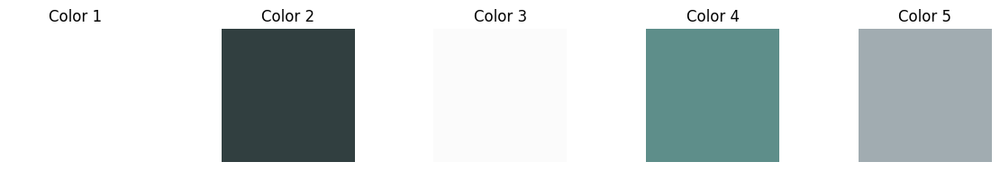

Dominant Colors in 0003.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


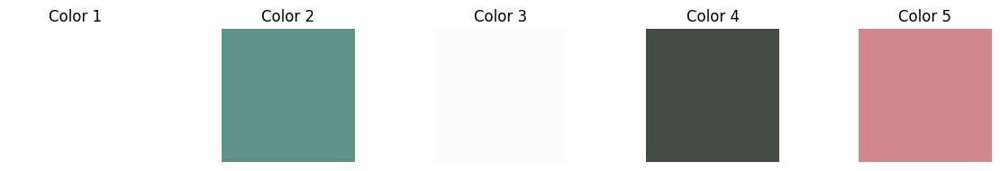

Dominant Colors in 0004.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


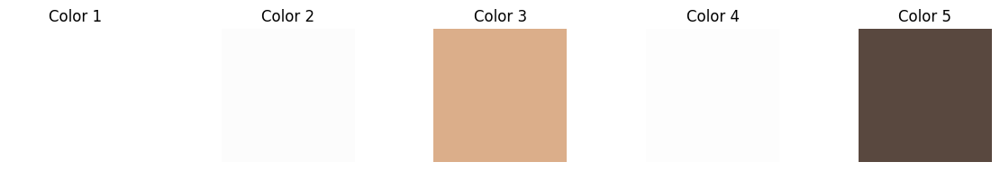

Dominant Colors in 0005.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


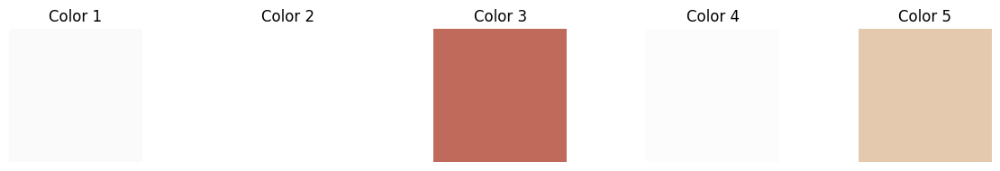

Dominant Colors in 0006.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


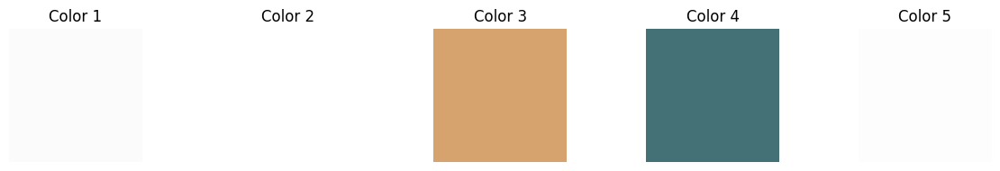

Dominant Colors in 0007.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


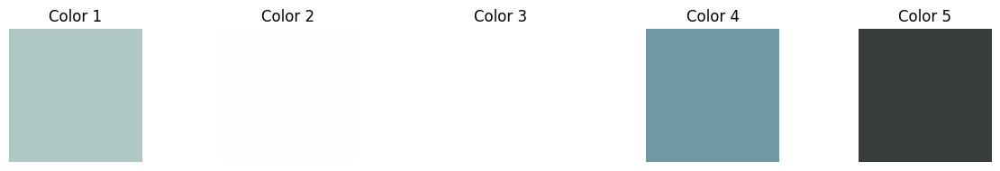

Dominant Colors in 0008.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


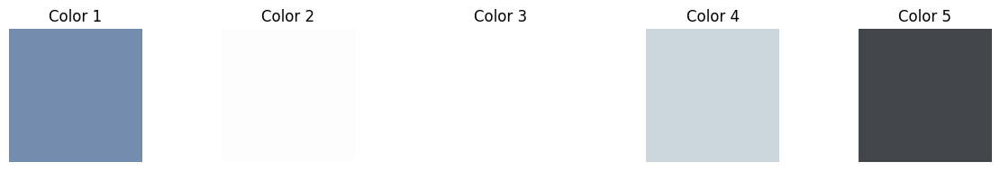

Dominant Colors in 0009.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


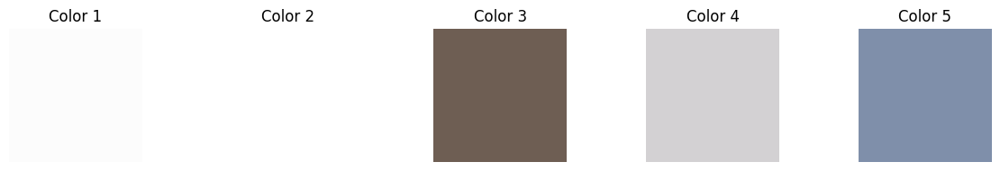

Dominant Colors in 0010.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


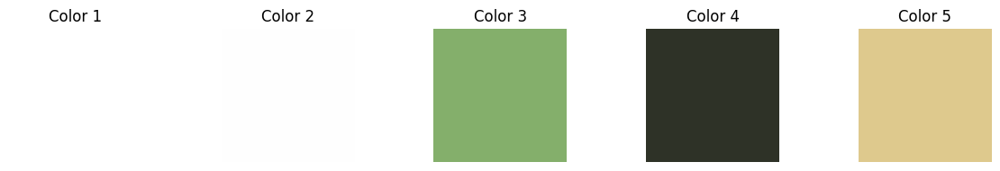

In [11]:
# Function to apply K-means clustering on sampled pixels and visualize dominant colors
def visualize_dominant_colors_sampled(img, n_clusters=5, n_samples=5000):
    # Reshape the image to be a list of pixels
    pixels = img.reshape(-1, 4)  # Including the alpha channel

    # Randomly sample pixels
    sampled_pixels = pixels[np.random.choice(pixels.shape[0], n_samples, replace=False), :]

    # Apply K-means clustering on sampled pixels
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(sampled_pixels)

    # Get the RGB values of the cluster centers
    cluster_centers = kmeans.cluster_centers_

    # Create a figure to visualize the dominant colors
    fig, ax = plt.subplots(1, n_clusters, figsize=(12, 2))

    for i, center in enumerate(cluster_centers):
        # Create an image with the color of the centroid
        color_img = np.zeros((50, 50, 4), dtype=np.uint8)
        color_img[:,:,:] = center
        ax[i].imshow(color_img)
        ax[i].axis('off')
        ax[i].set_title(f"Color {i+1}")

    plt.tight_layout()
    plt.show()

# Apply clustering technique on sampled pixels and visualize results for each image
for img_file in image_files:
    img_path = os.path.join(image_dir, img_file)
    with Image.open(img_path) as img:
        img_array = np.array(img)
        print(f"Dominant Colors in {img_file}:")
        visualize_dominant_colors_sampled(img_array)

Dominant Colors in 0001.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


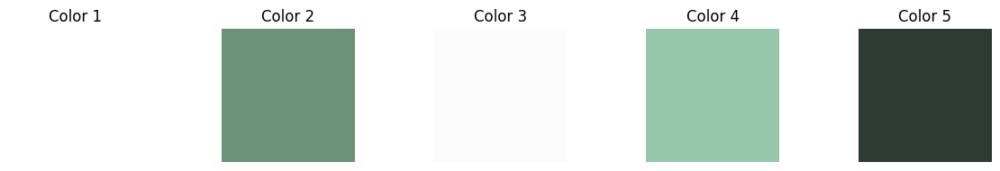

Dominant Colors in 0002.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


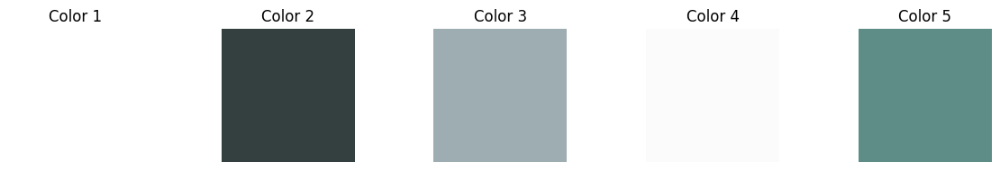

Dominant Colors in 0003.png:


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


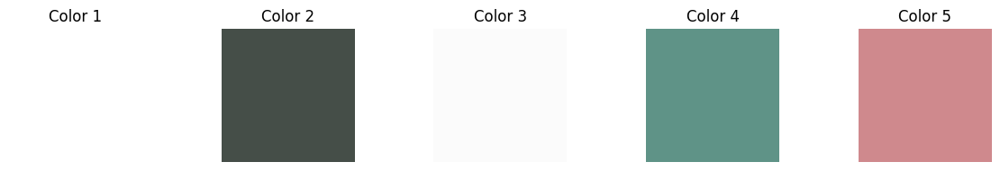

In [12]:
# Apply clustering technique on sampled pixels and visualize results for a subset of images
subset_image_files = image_files[:3]

for img_file in subset_image_files:
    img_path = os.path.join(image_dir, img_file)
    with Image.open(img_path) as img:
        img_array = np.array(img)
        print(f"Dominant Colors in {img_file}:")
        visualize_dominant_colors_sampled(img_array)

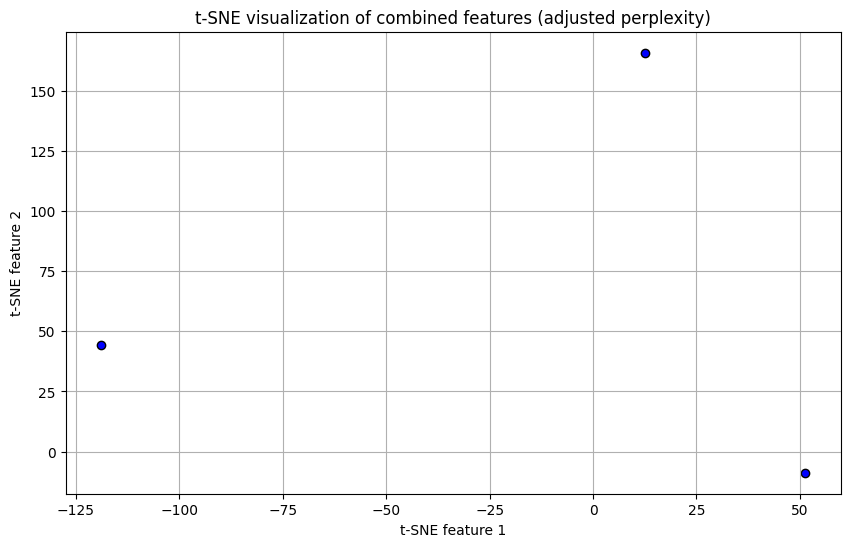

In [22]:
from sklearn.manifold import TSNE

# Adjust perplexity and apply t-SNE
tsne_adjusted = TSNE(n_components=2, perplexity=2, random_state=42)
tsne_features_adjusted = tsne_adjusted.fit_transform(combined_features_array)

# Extract 2D coordinates for visualization
x_tsne_adjusted = tsne_features_adjusted[:, 0]
y_tsne_adjusted = tsne_features_adjusted[:, 1]

# Plot the adjusted 2D t-SNE results
plt.figure(figsize=(10, 6))
plt.scatter(x_tsne_adjusted, y_tsne_adjusted, c='blue', marker='o', edgecolor='k')
plt.title('t-SNE visualization of combined features (adjusted perplexity)')
plt.xlabel('t-SNE feature 1')
plt.ylabel('t-SNE feature 2')
plt.grid(True)
plt.show()

**Anomaly Detection**

**Feature Extraction**

In [16]:
# Reload necessary libraries and variables
import os
import cv2
import numpy as np
from sklearn.decomposition import PCA

image_dir = 'Images'
image_files = [f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))]
image_files.sort()

# Reload a subset of images
subset_loaded_images = [cv2.imread(os.path.join(image_dir, img_file), cv2.IMREAD_UNCHANGED) for img_file in image_files[:3]]

# Flatten each image in the subset to create a feature vector
subset_feature_vectors = [img.ravel() for img in subset_loaded_images]

# Apply PCA for dimensionality reduction on the subset of images
pca_subset = PCA(n_components=0.95)  # Retain 95% of the variance
principal_components_subset = pca_subset.fit_transform(subset_feature_vectors)
reconstructed_images_subset = pca_subset.inverse_transform(principal_components_subset)

# Compute reconstruction errors for each image in the subset
reconstruction_errors_subset = [np.linalg.norm(original - reconstructed)
                               for original, reconstructed in zip(subset_feature_vectors, reconstructed_images_subset)]

reconstruction_errors_subset

[7.53362338713937e-10, 7.809005281604573e-10, 2.7134023054909826e-09]

**Feature Processing and Selection**

**Feature Normalization**

In [17]:
# Normalize the images
normalized_images = [img / 255.0 for img in subset_loaded_images]

# Check the normalization by displaying the min and max values of the first normalized image
min_value = np.min(normalized_images[0])
max_value = np.max(normalized_images[0])

min_value, max_value

(0.0, 1.0)

In [18]:
# Correcting the function to extract HOG features
from skimage.feature import hog
from skimage.color import rgb2gray
def extract_hog_features_corrected(image):
    gray_image = rgb2gray(image[:, :, :3])  # Convert to grayscale
    hog_features = hog(gray_image, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=False)
    return hog_features

# Extract HOG features for the subset of images
hog_features_list_corrected = [extract_hog_features_corrected(img) for img in subset_loaded_images]

# Display the length (number of features) for the first image's HOG feature vector
len(hog_features_list_corrected[0])


22500

In [19]:
# Function to extract color histogram features
def extract_color_histogram(image, bins=32):
    # Compute histogram for each color channel
    hist_r = np.histogram(image[:, :, 0], bins=bins, range=(0, 256))[0]
    hist_g = np.histogram(image[:, :, 1], bins=bins, range=(0, 256))[0]
    hist_b = np.histogram(image[:, :, 2], bins=bins, range=(0, 256))[0]

    # Concatenate histograms into a single feature vector
    hist_features = np.concatenate([hist_r, hist_g, hist_b])
    return hist_features

# Extract color histogram features for the subset of images
color_histogram_features_list = [extract_color_histogram(img) for img in subset_loaded_images]

# Display the length (number of features) for the first image's color histogram feature vector
len(color_histogram_features_list[0])

96

In [33]:
from keras.optimizers import Adam

# Define a function to create and compile an autoencoder
def create_autoencoder(input_dim, encoder_units, learning_rate):
    # Encoder
    encoder_input = Input(shape=(len(combined_features[0]),))
    encoded = Dense(units=encoder_units, activation='relu')(encoder_input)

    # Decoder
    decoded = Dense(input_dim, activation='sigmoid')(encoded)

    # Autoencoder = Encoder + Decoder
    autoencoder = Model(encoder_input, decoded)

    # Compile the model
    autoencoder.compile(optimizer=Adam(learning_rate=learning_rate), loss='mean_squared_error')

    return autoencoder

# Define architectures and hyperparameters
architectures = [32, 64, 128]
learning_rates = [0.001, 0.0001]
models = []

# Create models for each combination
for units in architectures:
    for lr in learning_rates:
        model = create_autoencoder(len(combined_features[0]), units, lr)
        models.append((model, units, lr))

len(models)


6

**Auto ML**

In [44]:
!pip install h2o
import h2o
h2o.init()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 257.4/257.4 MB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.44.0.1-py2.py3-none-any.whl size=257484150 sha256=f63337af1ad3a1a35b3670d62cb42fc95841475ea9d8cbccbf73c0edd0c829c8
  Stored in directory: /root/.cache/pip/wheels/d9/9b/ca/7345b72d17e1e17da37239d70631c3214ec9e541b0c9e700e2
Successfully built h2o
Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.20.1" 2023-08-24; OpenJDK Runtime Environment (build 11.0.20.1+1-post-Ubuntu-0ubuntu122.04); OpenJDK 64-Bit Server VM (build 11.0.20.1+1-post-Ubuntu-0ubuntu122.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpfndydyr3
  JVM stdout: /tmp/tmpfndydyr3/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpfndydyr3/h2o_unknownUser_s

H2O_cluster_uptime:,05 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.1
H2O_cluster_version_age:,15 days
H2O_cluster_name:,H2O_from_python_unknownUser_86h682
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.170 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [45]:
hf = h2o.H2OFrame(combined_features)


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [47]:
import pandas as pd

# Convert the combined_features into a DataFrame
df_combined_features = pd.DataFrame(combined_features)
print(df_combined_features.head())

   0      1      2      3      4      5      6      7      8      9      ...  \
0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0  ...   
1    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0  ...   
2    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0  ...   

   22586  22587  22588  22589  22590  22591  22592  22593  22594    22595  
0  272.0  216.0   95.0   43.0   25.0   26.0   31.0   27.0   19.0  19157.0  
1   85.0  125.0  172.0  409.0  161.0   99.0  380.0  220.0   71.0  19027.0  
2  245.0  219.0  192.0  348.0  477.0  566.0  368.0  314.0  169.0  23601.0  

[3 rows x 22596 columns]


In [51]:
hf = h2o.H2OFrame(df_combined_features)
print(hf.shape)
print(hf.summary())

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
(3, 22596)


<ipython-input-51-ce84f2979af9>:3: H2ODeprecationWarning: ``summary()`` is deprecated, please use ``show_summary()`` or ``get_summary()`` instead
  print(hf.summary())


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

None
